In [32]:
#from nilearn import plotting
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from nilearn import image
from nilearn import signal
from nilearn.maskers import NiftiMasker
from nilearn.maskers import NiftiMapsMasker
from nilearn.plotting import plot_roi
import nilearn as nl 
import nibabel as nib
import neuromaps as nmap
from sklearn.decomposition import PCA
import bids
import os
import glob
import ray
import psutil


In [2]:
ray.shutdown()

num_cpus = psutil.cpu_count(logical=False)

ray.init(num_cpus=num_cpus)

@ray.remote
def fit_mask_get_PC1(current_mask, sub_data):
    try:
        fit_2_mask = current_mask.fit_transform(sub_data)
        PCA_instance = PCA(n_components=1)
        PCA_instance.fit(fit_2_mask)
        PC1_score = PCA_instance.explained_variance_ratio_[0]
    except ValueError:
        PC1_score = 0
    return PC1_score


2023-08-09 14:24:28,013	INFO worker.py:1612 -- Started a local Ray instance. View the dashboard at 127.0.0.1:8265 


In [3]:
ray.shutdown()

## Open Directory

In [4]:
# Now open a directory/folder 
fd = os.open("/Users/luisalvarez/Documents/Research_Elective_Data", os.O_RDONLY)

# Use os.fchdir() method to change the dir/folder
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

Current working dir : /Users/luisalvarez/Documents/Research_Elective_Data


In [5]:
def get_files(path):
    for file in os.listdir(path):
        if os.path.isfile(os.path.join(path, file)):
            return file

In [6]:
# Store the "path's" for each '.nii' file

# Store file names
COC_PP_1_paths = []
COC_PP_2_paths = []
PLA_PP_1_paths = []
PLA_PP_2_paths = []

# Set paths for each session folder
dir_path1 = os.getcwd()
dir_path1 += "/CANCOC_PP_1"

dir_path2 = os.getcwd()
dir_path2 += "/CANCOC_PP_2"

# Iterate directory
for path in os.listdir("CANCOC_PP_1"):
    
    if os.path.isdir(os.path.join(dir_path1, path)):
           
        currentsub_path = os.path.join(dir_path1, path)
            
        path_coc = path+"COC"
        path_pla = path+"PLA"
    
        if os.path.isdir(os.path.join(currentsub_path, path_coc)): 
            current_sub_coc_file = get_files(os.path.join(currentsub_path, path_coc))
            current_sub_coc_file = os.path.join(os.path.join(os.path.join("CANCOC_PP_1/", path), path_coc), current_sub_coc_file)
            #os.path.join(os.path.join(path, path_coc), current_sub_coc_file)
            COC_PP_1_paths.append(current_sub_coc_file)
        else: 
            print(os.path.join(currentsub_path, path_coc))
        
        if os.path.isdir(os.path.join(currentsub_path, path_pla)): 
            current_sub_pla_file = get_files(os.path.join(currentsub_path, path_pla))
            current_sub_pla_file = os.path.join(os.path.join(os.path.join("CANCOC_PP_1/", path), path_pla), current_sub_pla_file)
            #current_sub_pla_file = os.path.join(os.path.join(currentsub_path, path_pla), current_sub_pla_file)
            PLA_PP_1_paths.append(current_sub_pla_file)

    else:
        print(path + ": false")
        
for path in os.listdir("CANCOC_PP_2"):
    
    if os.path.isdir(os.path.join(dir_path2, path)):
           
        currentsub_path = os.path.join(dir_path2, path)
            
        path_coc = path+"COC"
        path_pla = path+"PLA"
    
        if os.path.isdir(os.path.join(currentsub_path, path_coc)): 
            current_sub_coc_file = get_files(os.path.join(currentsub_path, path_coc))
            current_sub_coc_file = os.path.join(os.path.join(os.path.join("CANCOC_PP_2/", path), path_coc), current_sub_coc_file)
            COC_PP_2_paths.append(current_sub_coc_file)
        else: 
            print(os.path.join(currentsub_path, path_coc))
        
        if os.path.isdir(os.path.join(currentsub_path, path_pla)): 
            current_sub_pla_file = get_files(os.path.join(currentsub_path, path_pla))
            current_sub_pla_file = os.path.join(os.path.join(os.path.join("CANCOC_PP_2/", path), path_pla), current_sub_pla_file)
            PLA_PP_2_paths.append(current_sub_pla_file)

    else:
        print(path + ": false")


.DS_Store: false
.DS_Store: false


# Load functional image for subject 1 (P5259)

In [7]:
tr_drop = 5
sub1_coc = image.load_img(COC_PP_1_paths[0])
sub1_pla = image.load_img(PLA_PP_1_paths[0])

#Remove the first 5 TRs
sub1_coc = sub1_coc.slicer[:,:,:,tr_drop:]
sub1_pla = sub1_pla.slicer[:,:,:,tr_drop:]

print("sub1_coc shape: %s" % str(sub1_coc.shape))
print("sub1_pla shape: %s" % str(sub1_pla.shape))


sub1_coc shape: (79, 95, 69, 131)
sub1_pla shape: (79, 95, 69, 123)


# Brain parcellations


## Glasser atlas for Neuroparc lib

In [60]:
from nltools import Brain_Data
#from nibabel.testing import get_test_data

lewis_LG_path = "/Users/luisalvarez/Documents/Research_Elective_Data/bleg/BigBrain/Labels/lh.cortex.BLeG.label.gii"
lewis_full_path = "/Users/luisalvarez/Documents/Research_Elective_Data/bleg/BigBrain/full8_400um_optbal.nii"
lewis_LH_fs_path = "/Users/luisalvarez/Documents/Research_Elective_Data/bleg/FreeSurfer/Labels/lh.cortex.BLeG.annot"
glasser_path_labels = "/Users/luisalvarez/Documents/GitHub/neuroparc/atlases/label/Human/Anatomical-labels-csv/Glasser.csv"
lewis_full_path_mgh = "/Users/luisalvarez/Documents/Research_Elective_Data/bleg/BigBrain/full8_400um_optbal.mgz"

#glasser1 = nb.load(glasser_path)
#glasser1_data = glasser1.get_data()
#print(glasser1_data.shape)
lewis_LG_surf_data = nl.surface.load_surf_data(lewis_LG_path) 
lewis_LG_surf_data2 = nib.freesurfer.io.read_annot(lewis_LH_fs_path)
lewis_full_surf_mgh = nib.freesurfer.mghformat.MGHImage(lewis_full_path_mgh)
#lewis_LG_surf_data3 = nib.gifti.GiftiImage(lewis_LG_path)#.agg_data()
lewis_LG_surf_data4 = nib.gifti.parse_gifti_fast.GiftiImageParser(lewis_LG_path)
#lewis_LG_maps = nl.image.get_data(, lewis_full_path)
#Brain_Data(lewis_full_path)#.to_nifti()
#print(lewis_LG_surf_data2.shape)

type(lewis_LG_surf_data4)

TypeError: __init__() missing 1 required positional argument: 'affine'

In [71]:
lewis_LG_surf_vertex_count = lewis_LG_surf_data2[0]
lewis_LG_surf_vertex_number = lewis_LG_surf_data2[1]
lewis_LG_surf_vertex_label = lewis_LG_surf_data2[2]



In [48]:
from nilearn import datasets
from nilearn import surface
from nilearn import plotting

fsaverage = datasets.fetch_surf_fsaverage()

texture = surface.vol_to_surf(lewis_LG_surf_data, fsaverage.pial_right, n_samples=1, interpolation="nearest")

figure = plotting.view_surf(fsaverage.pial_right, texture, cmap='viridis', symmetric_cmap=False) 

figure

TypeError: Data given cannot be loaded because it is not compatible with nibabel format:
0

In [8]:
glasser_meta = pd.read_json(glasser_path_meta)
glasser_meta.head(10)

,MetaData,rois
AtlasName,Glasser,NaN
Description,,NaN
Native Coordinate Space,,NaN
Hierarchical,no,NaN
Symmetrical,yes,NaN
Number of Regions,180,NaN
Average Volume Per Region,65.39444444444445,NaN
Year Generated,2020,NaN
Generation Method,,NaN
Source,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4...,NaN


Note that Glasser atlas has 180 regions, so 90 right and 90 left. Since, 1 label is null. Probably, can access each roi based on the z-axis.

In [9]:
glasser_labels = pd.read_csv(glasser_path_labels, index_col=0, header=None, names=["Labels"])

glasser_labels.head()

,Labels
1,Primary_visual_cortex
2,Medial_superior_temporal_area
3,Sixth_Visual_Area
4,Second_Visual_Area
5,Third_Visual_Area


/Users/luisalvarez/opt/anaconda3/lib/python3.9/site-packages/nilearn/plotting/img_plotting.py:300: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  anat_img = load_mni152_template()


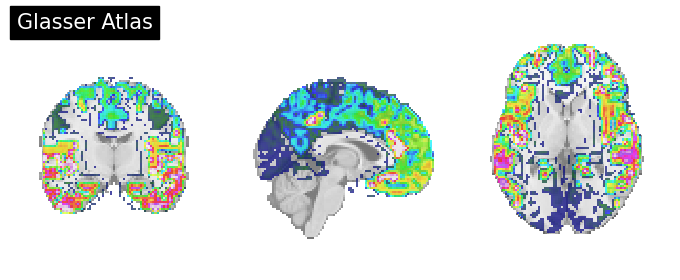

In [10]:
# Visualize parcellation atlas
plot_roi(glasser_maps, draw_cross=False, annotate=False, title="Glasser Atlas")

# Check the fit/shape of each of Glasser ROI's

In [11]:
# Re-sample sub1 coc and pla files, and generate background images to plot each roi.

sub1_coc_re_Gla = image.resample_to_img(sub1_coc, glasser_maps, interpolation='nearest')
sub1_pla_re_Gla = image.resample_to_img(sub1_pla, glasser_maps, interpolation='nearest')

sub1_coc_re_Gla_mean = image.mean_img(sub1_coc_re_Gla)
sub1_pla_re_Gla_mean = image.mean_img(sub1_pla_re_Gla)

In [13]:

#roi_img = nl.image.new_img_like(AA_maps, nl.image.get_data(AA_maps) == int( AA_indices[0] ))

#masker = NiftiMasker(mask_img=roi_img, verbose=False).fit()

#plotting_pla = plot_roi(roi_img, bg_img=sub1_coc_re_AA_mean, black_bg=False, title=str("PLA: " + AA_labels[0]))

In [24]:
# So, I'm creating a mask for each roi/network in AA atlas and storing it in the variable below.
# Also, the loop below generates two images per roi (one using sub_1_coc as background and another one using sub_1_pla)
# each image is saved into folder Yeo_Roi_img.
GLA_roi_masks = []

for x in range(1, 181, 1):

    try:
        print("Computing and plotting roi_" +str(x) +": " + str(glasser_labels.Labels[x]))
        roi_img = nl.image.new_img_like(glasser_maps, nl.image.get_data(glasser_maps) == x)
        #nl.image.new_img_like(glasser_maps, nl.image.get_data(glasser2) == x )
        masker = NiftiMasker(mask_img=roi_img, verbose=False).fit()
        GLA_roi_masks.append(masker)

        #if(x==115):
        #    break

        #masker_img = masker.mask_img_

        #output_name = "Glasser_Roi_img/AA_Roi_" + str(glasser_labels.Labels[x])

        #plotting_pla = plot_roi(masker_img, bg_img=sub1_pla_re_Gla_mean, black_bg=False, title=str("PLA: " + glasser_labels.Labels[x]))
    
        #plotting_pla.savefig(output_name)
        #plotting_coc.savefig(output_name_coc)
    except FileNotFoundError:
        print("Problem with roi_" +str(x) + " " + str(glasser_labels.Labels[x]))
    

Computing and plotting roi_1: Primary_visual_cortex
Computing and plotting roi_2: Medial_superior_temporal_area
Computing and plotting roi_3: Sixth_Visual_Area
Computing and plotting roi_4: Second_Visual_Area
Computing and plotting roi_5: Third_Visual_Area
Computing and plotting roi_6: Forth_Visual_Area
Computing and plotting roi_7: Eighth_Visual_Area
Computing and plotting roi_8: Primary_Motor_Cortex
Computing and plotting roi_9: Primary_Sensory_Cortex
Computing and plotting roi_10: Frontal_Eye_Field
Computing and plotting roi_11: Premotor_Eye_Field
Computing and plotting roi_12: Area_55b
Computing and plotting roi_13: Area_V3A
Computing and plotting roi_14: RetroSplenial_Complex
Computing and plotting roi_15: Parieto-Occipital_Sulcus_Area_2
Computing and plotting roi_16: Seventh_Visual_Area
Computing and plotting roi_17: IntraParietal_Sulcus_Area_1
Computing and plotting roi_18: Fusiform_Face_Complex
Computing and plotting roi_19: Area_V3B
Computing and plotting roi_20: Lateral_Occip

In [15]:
#glasser2_test_roi = nl.image.new_img_like(glasser2, nl.image.get_data(glasser2) == 1)

#plot_roi(glasser2_test_roi, draw_cross=False, annotate=False, title="Glasser Atlas")

In [16]:
#matplotlib.pyplot.close()

# Estimating PC1 for each mask/roi

In [13]:
# Create Dataframe to store each participants PC1 scores. 

COC_PC1_GLA_scores_df = pd.DataFrame(columns=glasser_labels.Labels)
PLA_PC1_GLA_scores_df = pd.DataFrame(columns=glasser_labels.Labels)

COC2_PC1_GLA_scores_df = pd.DataFrame(columns=glasser_labels.Labels)
PLA2_PC1_GLA_scores_df = pd.DataFrame(columns=glasser_labels.Labels)

zeros_holder = np.zeros((1, 180))

# Loop below for paticipants in "PP_1"
for path in os.listdir("CANCOC_PP_1"):
    if os.path.isdir(os.path.join(dir_path1, path)): 
           
        current_p_df = pd.DataFrame(data=zeros_holder, columns=glasser_labels.Labels, index=[path])
        COC_PC1_GLA_scores_df = COC_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)
        PLA_PC1_GLA_scores_df = PLA_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)

for path in os.listdir("CANCOC_PP_2"):
    if os.path.isdir(os.path.join(dir_path2, path)): 
           
        current_p_df = pd.DataFrame(data=zeros_holder, columns=glasser_labels.Labels, index=[path])
        COC2_PC1_GLA_scores_df = COC2_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)
        PLA2_PC1_GLA_scores_df = PLA2_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)

#COC_PC1_scores_df.head(25)

/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_713/30750255.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  COC_PC1_GLA_scores_df = COC_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_713/30750255.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  PLA_PC1_GLA_scores_df = PLA_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_713/30750255.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  COC_PC1_GLA_scores_df = COC_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_713/30750255.py:17: FutureWarning: The

In [192]:

#sub1_PP2_PLA_PC1_scores = []

#for current_roi in range(180):
    
    #sub1_PP2_PLA_PC1_scores.append(fit_mask_get_PC1.remote(GLA_roi_masks[current_roi], PLA_PP_2_paths[0]))
    

   




In [193]:
#sub1_PP2_PLA_scores = ray.get(sub1_PP2_PLA_PC1_scores) 

#PLA2_PC1_GLA_scores_df.iloc[0] = sub1_PP2_PLA_scores[:]

#PLA2_PC1_GLA_scores_df.head(20)


In [158]:
#COC_PC1_GLA_scores_df.to_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_Maastricht2023/GLAFIT_COC_PP1_scores.csv')
#PLA_PC1_GLA_scores_df.to_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_Maastricht2023/GLAFIT_PLA_PP1_scores.csv')
#COC2_PC1_GLA_scores_df.to_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_Maastricht2023/GLAFIT_COC_PP2_scores.csv')
#PLA2_PC1_GLA_scores_df.to_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_Maastricht2023/GLAFIT_PLA_PP2_scores.csv')

COC_PC1_GLA_scores_df = pd.read_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_Maastricht2023/GLAFIT_COC_PP1_scores.csv', index_col=0)
PLA_PC1_GLA_scores_df = pd.read_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_Maastricht2023/GLAFIT_PLA_PP1_scores.csv', index_col=0)
COC2_PC1_GLA_scores_df = pd.read_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_Maastricht2023/GLAFIT_COC_PP2_scores.csv', index_col=0)
PLA2_PC1_GLA_scores_df = pd.read_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_Maastricht2023/GLAFIT_PLA_PP2_scores.csv', index_col=0)

#COC_PC1_AA_scores_df.head()

# Visualizing Results

## COC PP1

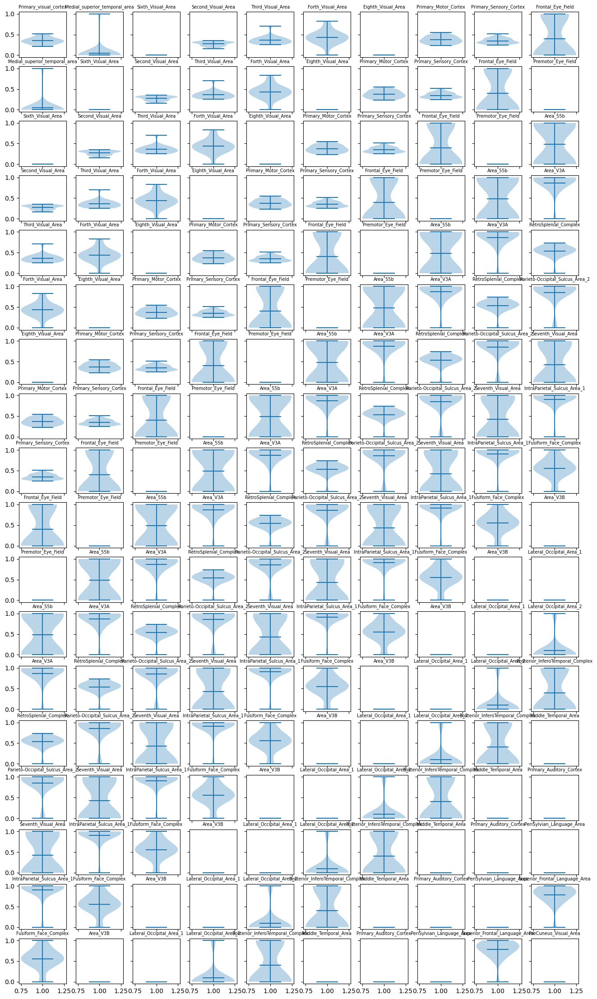

In [163]:
COC_PC1_GLA_scores_df_cols = COC_PC1_GLA_scores_df.columns
COC_PC1_GLA_scores_df.fillna(0,inplace=True)

fig, axs = plt.subplots(18, 10, figsize=(16, 28), sharex=True, sharey=True)

for x in range(18):
    for y in range(10):
        current_roi = COC_PC1_GLA_scores_df.columns[x+y]
        axs[x, y].violinplot(COC_PC1_GLA_scores_df[current_roi] , vert=True, showmeans=True)
        axs[x, y].set_title(current_roi, fontsize=7)
        


In [168]:

COC_GLA_COC1_avg_fit = []

for x in range(len(glasser_labels)):
    COC_GLA_COC1_avg_fit.append(COC_PC1_GLA_scores_df[glasser_labels.Labels.iloc[x]].mean(skipna=True))
    
COC_GLA_COC1_avg_fit
    

[0.35166512429714203,
 0.05,
 0.0,
 0.27744888365268705,
 0.3636914983391762,
 0.4343174293637276,
 0.0,
 0.3723101556301117,
 0.34672890082001684,
 0.39977383315563203,
 0.0,
 0.4831473380327225,
 0.8676752209663391,
 0.5362947791814804,
 0.8538024932146072,
 0.4264028072357178,
 0.9067013055086136,
 0.5532600715756416,
 0.0,
 0.0,
 0.1,
 0.3999999612569809,
 0.0,
 0.0,
 0.0,
 0.7790911763906478,
 0.0,
 0.0,
 0.0,
 0.0,
 0.5589066535234452,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.5481302738189697,
 0.6654876306653023,
 0.7929965376853942,
 0.7542071253061294,
 0.0,
 0.7070016652345658,
 0.25,
 0.5932921126484871,
 0.05,
 0.25,
 0.607020941376686,
 0.1,
 0.6762579590082168,
 0.19103771448135376,
 0.4141519218683243,
 0.50698401927948,
 0.4499254196882248,
 0.7833633691072464,
 0.7405060932040215,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.05,
 0.5785407841205596,
 0.5728576824069023,
 0.0,
 0.5888288795948029,
 0.675797900557518,
 0.4619511753320694,
 0.5965792044997216,
 

In [171]:

#ray.shutdown()

GLA_masks_avg_fit_vis = []

for x in range(len(glasser_labels)):
    shit_another_mask = GLA_roi_masks[x].fit_transform(COC_PP_1_paths[0])
    #yeo_roi_masks[current_roi].fit_transform(sub1_pla) 
    runner = shit_another_mask.shape[1]
    score = COC_GLA_COC1_avg_fit[x]
    zeros_mask = np.zeros((1, runner))
    zeros_mask[0, :] = score*100
    GLA_masks_avg_fit_vis.append(GLA_roi_masks[x].inverse_transform(zeros_mask))
    
    

In [172]:
# Make zero matrix (to get the shape right) ... then run for loop and sum all matrices.
zero_matrix = nl.image.get_data(GLA_masks_avg_fit_vis[0]).shape
COC_GLA_COC1_avg_fit_vis = np.zeros((zero_matrix))

# Run loop for times (number of rois). Each iteration get matrix with PC1 scores for that roi
# And add it to the "COC_AA_COC1_avg_fit_vis."
for x in range(len(glasser_labels)):
    current_roi_scores = nl.image.get_data(GLA_masks_avg_fit_vis[x])
    COC_GLA_COC1_avg_fit_vis = COC_GLA_COC1_avg_fit_vis + current_roi_scores

COC_GLA_COC1_avg_fit_vis = nl.image.new_img_like(glasser_maps, COC_GLA_COC1_avg_fit_vis)

In [173]:
from nilearn import datasets
from nilearn import surface
from nilearn import plotting

fsaverage = datasets.fetch_surf_fsaverage()

texture = surface.vol_to_surf(COC_GLA_COC1_avg_fit_vis.slicer[:, :, :, 0], fsaverage.pial_right, n_samples=1, interpolation="nearest")

figure = plotting.view_surf(fsaverage.pial_right, texture, cmap='viridis', symmetric_cmap=False) 

figure


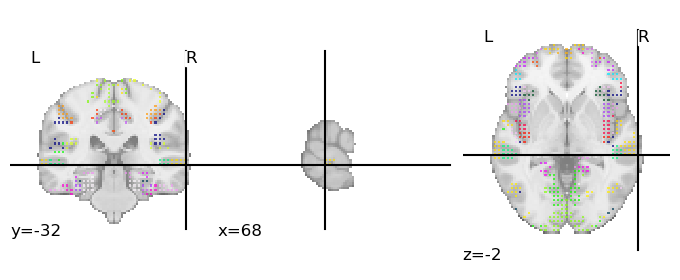

In [179]:
plot_roi(COC_GLA_COC1_avg_fit_vis.slicer[:, :, :, 0]) 

## PLA PP1

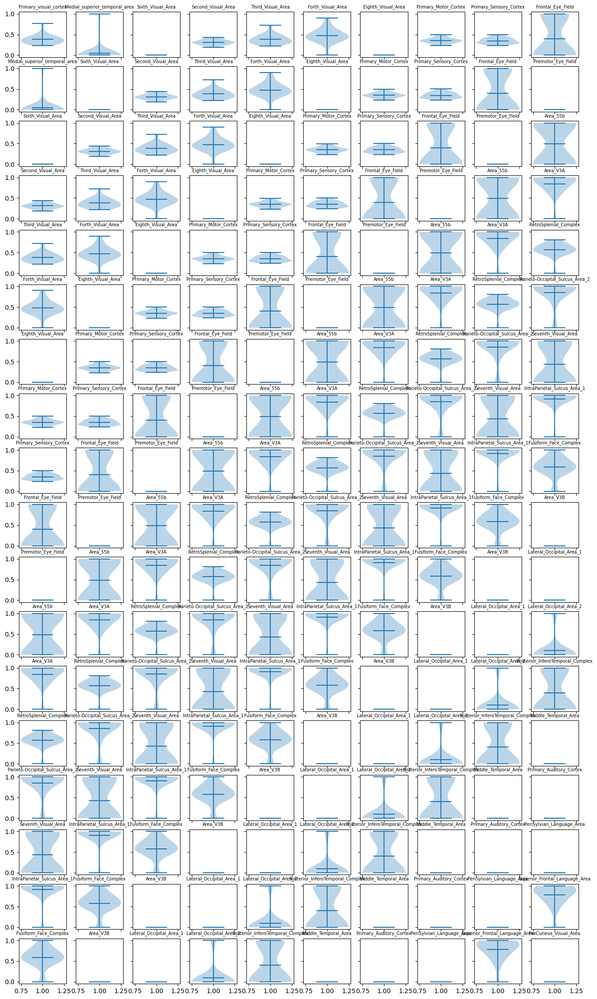

In [180]:
PLA_PC1_GLA_scores_df_cols = PLA_PC1_GLA_scores_df.columns
PLA_PC1_GLA_scores_df.fillna(0,inplace=True)

fig, axs = plt.subplots(18, 10, figsize=(16, 28), sharex=True, sharey=True)

for x in range(18):
    for y in range(10):
        current_roi = PLA_PC1_GLA_scores_df.columns[x+y]
        axs[x, y].violinplot(PLA_PC1_GLA_scores_df[current_roi] , vert=True, showmeans=True)
        axs[x, y].set_title(current_roi, fontsize=7)

In [185]:

PLA_GLA_COC1_avg_fit = []

for x in range(len(glasser_labels)):
    PLA_GLA_COC1_avg_fit.append(PLA_PC1_GLA_scores_df[glasser_labels.Labels.iloc[x]].mean(skipna=True))
    
PLA_GLA_COC1_avg_fit

[0.3891269415616989,
 0.05,
 0.0,
 0.3134253732860088,
 0.3839949809014797,
 0.4748563259840012,
 0.0,
 0.35096577927470207,
 0.347241635620594,
 0.39982023239135744,
 0.0,
 0.48930235803127287,
 0.8403971672058106,
 0.5680156752467156,
 0.849263858795166,
 0.43073623776435854,
 0.9098839044570923,
 0.5812327966094017,
 0.0,
 0.0,
 0.1,
 0.399964314699173,
 0.0,
 0.0,
 0.0,
 0.7786375522613526,
 0.0,
 0.0,
 0.0,
 0.0,
 0.5596474528312683,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.49684925079345704,
 0.6723080918192863,
 0.8083276063203811,
 0.7267561435699463,
 0.0,
 0.7163331031799316,
 0.25,
 0.6021465227007866,
 0.05,
 0.2,
 0.6307533264160157,
 0.1,
 0.7108798414468765,
 0.17878798842430116,
 0.4306480884552002,
 0.543216222524643,
 0.44492060095071795,
 0.7697016686201096,
 0.7360530853271484,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.05,
 0.6112454995512963,
 0.5950496315956115,
 0.0,
 0.6149495169520378,
 0.7062677755951882,
 0.46048548966646197,
 0.6462696522474289,

In [194]:
GLA_masks_avg_fit_vis2 = []

for x in range(len(glasser_labels)):
    shit_another_mask = GLA_roi_masks[x].fit_transform(PLA_PP_1_paths[0])
    runner = shit_another_mask.shape[1]
    score = PLA_GLA_COC1_avg_fit[x]
    zeros_mask = np.zeros((1, runner))
    zeros_mask[0, :] = score*100
    GLA_masks_avg_fit_vis2.append(GLA_roi_masks[x].inverse_transform(zeros_mask))

In [195]:
# Make zero matrix (to get the shape right) ... then run for loop and sum all matrices.
zero_matrix = nl.image.get_data(GLA_masks_avg_fit_vis2[0]).shape
PLA_GLA_PC1_avg_fit_vis = np.zeros((zero_matrix))

# Run loop for times (number of rois). Each iteration get matrix with PC1 scores for that roi
# And add it to the "COC_AA_COC1_avg_fit_vis."
for x in range(len(glasser_labels)):
    current_roi_scores = nl.image.get_data(GLA_masks_avg_fit_vis2[x])
    PLA_GLA_PC1_avg_fit_vis = PLA_GLA_PC1_avg_fit_vis + current_roi_scores

PLA_GLA_PC1_avg_fit_vis = nl.image.new_img_like(glasser_maps, PLA_GLA_PC1_avg_fit_vis)

In [196]:
texture2 = surface.vol_to_surf(PLA_GLA_PC1_avg_fit_vis.slicer[:, :, :, 0], fsaverage.pial_right, n_samples=1, interpolation="nearest")

figure2 = plotting.view_surf(fsaverage.pial_right, texture2, cmap='viridis', symmetric_cmap=False) 

figure2

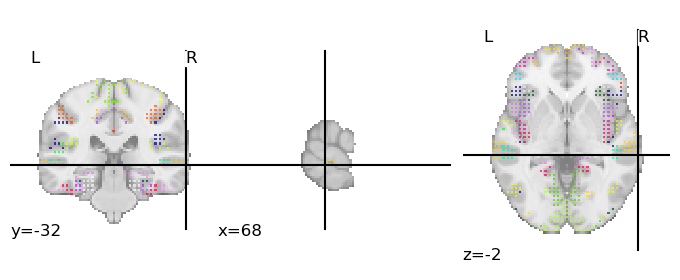

In [197]:
plot_roi(PLA_GLA_PC1_avg_fit_vis.slicer[:, :, :, 0]) 

## COC PP2


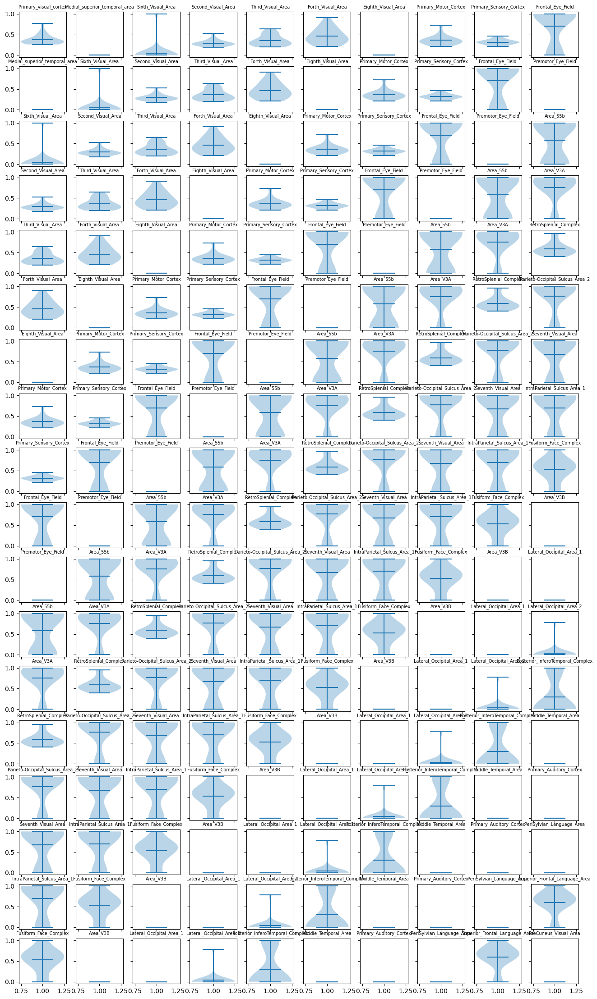

In [190]:
COC2_PC1_GLA_scores_df_cols = COC2_PC1_GLA_scores_df.columns
COC2_PC1_GLA_scores_df.fillna(0,inplace=True)

fig, axs = plt.subplots(18, 10, figsize=(16, 28), sharex=True, sharey=True)

for x in range(18):
    for y in range(10):
        current_roi = COC2_PC1_GLA_scores_df.columns[x+y]
        axs[x, y].violinplot(COC2_PC1_GLA_scores_df[current_roi] , vert=True, showmeans=True)
        axs[x, y].set_title(current_roi, fontsize=7)

In [191]:
COC2_GLA_COC1_avg_fit = []

for x in range(len(glasser_labels)):
    COC2_GLA_COC1_avg_fit.append(COC2_PC1_GLA_scores_df[glasser_labels.Labels.iloc[x]].mean(skipna=True))
    
COC2_GLA_COC1_avg_fit

[0.3809503898024559,
 0.0,
 0.05,
 0.29404386729001997,
 0.35864305645227434,
 0.4623964324593544,
 0.0,
 0.3639075420796871,
 0.3154477670788765,
 0.7,
 0.0,
 0.5815408170223236,
 0.7544774085283279,
 0.5890894085168839,
 0.7689267128705979,
 0.6730922639369965,
 0.6992926239967346,
 0.5296655550599099,
 0.0,
 0.0,
 0.03914851248264313,
 0.2999965101480484,
 0.0,
 0.0,
 0.0,
 0.6010611176490783,
 0.0,
 0.0,
 0.0,
 0.0,
 0.4307753086090088,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.6985520452260972,
 0.5770160242915153,
 0.7088358730077744,
 0.5957426205277443,
 0.0,
 0.6409089833498001,
 0.2,
 0.4945469707250595,
 0.05,
 0.2,
 0.5468388080596924,
 0.15,
 0.5649188667535782,
 0.1463551938533783,
 0.39676461145281794,
 0.49013871103525164,
 0.4004697196185589,
 0.6215202808380127,
 0.6796143800020218,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.05,
 0.48581879436969755,
 0.5181213304400444,
 0.0,
 0.5255209222435951,
 0.6038472563028335,
 0.43924319446086885,
 0.51993829160928

In [198]:
GLA_masks_avg_fit_vis3 = []

for x in range(len(glasser_labels)):
    shit_another_mask = GLA_roi_masks[x].fit_transform(COC_PP_2_paths[0])
    #yeo_roi_masks[current_roi].fit_transform(sub1_pla) 
    runner = shit_another_mask.shape[1]
    score = COC2_GLA_COC1_avg_fit[x]
    zeros_mask = np.zeros((1, runner))
    zeros_mask[0, :] = score*100
    GLA_masks_avg_fit_vis3.append(GLA_roi_masks[x].inverse_transform(zeros_mask))
    
    

In [200]:
# Make zero matrix (to get the shape right) ... then run for loop and sum all matrices.
zero_matrix = nl.image.get_data(GLA_masks_avg_fit_vis3[0]).shape
COC2_GLA_PC1_avg_fit_vis = np.zeros((zero_matrix))

# Run loop for times (number of rois). Each iteration get matrix with PC1 scores for that roi
# And add it to the "COC_AA_COC1_avg_fit_vis."
for x in range(len(glasser_labels)):
    current_roi_scores = nl.image.get_data(GLA_masks_avg_fit_vis3[x])
    COC2_GLA_PC1_avg_fit_vis = COC2_GLA_PC1_avg_fit_vis + current_roi_scores

COC2_GLA_PC1_avg_fit_vis = nl.image.new_img_like(glasser_maps, COC2_GLA_PC1_avg_fit_vis)

In [201]:
texture3 = surface.vol_to_surf(COC2_GLA_PC1_avg_fit_vis.slicer[:, :, :, 0], fsaverage.pial_right, n_samples=1, interpolation="nearest")

figure3 = plotting.view_surf(fsaverage.pial_right, texture3, cmap='viridis', symmetric_cmap=False) 

figure3

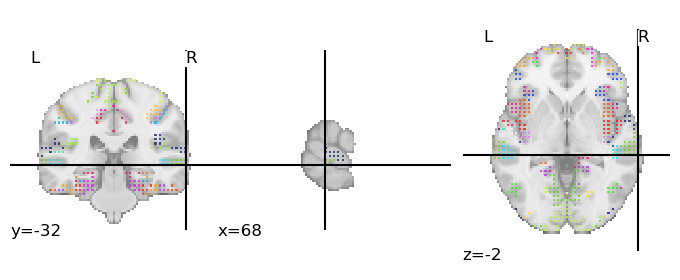

In [202]:
plot_roi(COC2_GLA_PC1_avg_fit_vis.slicer[:, :, :, 0]) 

## PLA PP2


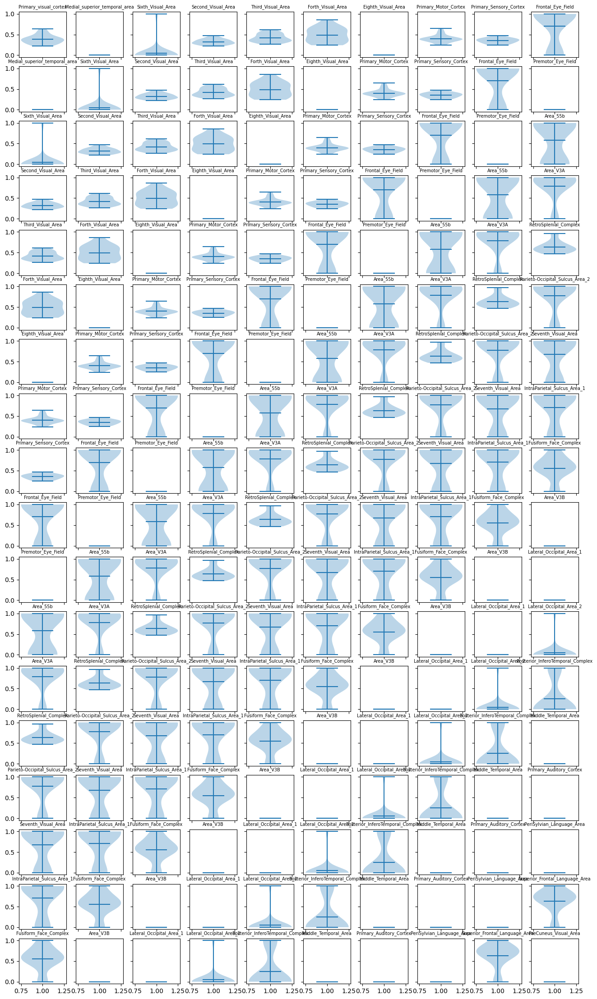

In [203]:
PLA2_PC1_GLA_scores_df_cols = PLA_PC1_GLA_scores_df.columns
PLA2_PC1_GLA_scores_df.fillna(0,inplace=True)

fig, axs = plt.subplots(18, 10, figsize=(16, 28), sharex=True, sharey=True)

for x in range(18):
    for y in range(10):
        current_roi = PLA2_PC1_GLA_scores_df.columns[x+y]
        axs[x, y].violinplot(PLA2_PC1_GLA_scores_df[current_roi] , vert=True, showmeans=True)
        axs[x, y].set_title(current_roi, fontsize=7)

In [204]:
PLA2_GLA_COC1_avg_fit = []

for x in range(len(glasser_labels)):
    PLA2_GLA_COC1_avg_fit.append(PLA2_PC1_GLA_scores_df[glasser_labels.Labels.iloc[x]].mean(skipna=True))
    
PLA2_GLA_COC1_avg_fit

[0.3831156395375729,
 0.0,
 0.05,
 0.323574835062027,
 0.4198287293314934,
 0.4895599871873856,
 0.0,
 0.40083916261792185,
 0.351027562469244,
 0.7,
 0.0,
 0.5792883545160293,
 0.7835241079330444,
 0.6348982363939285,
 0.7727813243865966,
 0.6730930775403976,
 0.7047979801893234,
 0.5511581838130951,
 0.0,
 0.0,
 0.05,
 0.24999572038650514,
 0.0,
 0.0,
 0.0,
 0.6272454708814621,
 0.0,
 0.0,
 0.0,
 0.0,
 0.43290536403656005,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.699132576584816,
 0.5885050073266029,
 0.6943070471286774,
 0.6565443485975265,
 0.0,
 0.6637172788381577,
 0.2,
 0.5260107398033143,
 0.05,
 0.15,
 0.6081240624189377,
 0.15,
 0.5769618332386017,
 0.1472867339849472,
 0.46603961661458015,
 0.5517117589712143,
 0.4153532966971397,
 0.6235449701547623,
 0.6872932806611061,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.05,
 0.5403552755713463,
 0.5503724053502083,
 0.0,
 0.5607960656285286,
 0.6030161648988723,
 0.4631056010723114,
 0.5710474967956543,
 0.1,
 0.0,
 0.

In [205]:
GLA_masks_avg_fit_vis4 = []

for x in range(len(glasser_labels)):
    shit_another_mask = GLA_roi_masks[x].fit_transform(PLA_PP_2_paths[0])
    runner = shit_another_mask.shape[1]
    score = PLA2_GLA_COC1_avg_fit[x]
    zeros_mask = np.zeros((1, runner))
    zeros_mask[0, :] = score*100
    GLA_masks_avg_fit_vis4.append(GLA_roi_masks[x].inverse_transform(zeros_mask))

In [206]:
# Make zero matrix (to get the shape right) ... then run for loop and sum all matrices.
zero_matrix = nl.image.get_data(GLA_masks_avg_fit_vis4[0]).shape
PLA2_GLA_PC1_avg_fit_vis = np.zeros((zero_matrix))

# Run loop for times (number of rois). Each iteration get matrix with PC1 scores for that roi
# And add it to the "COC_AA_COC1_avg_fit_vis."
for x in range(len(glasser_labels)):
    current_roi_scores = nl.image.get_data(GLA_masks_avg_fit_vis4[x])
    PLA2_GLA_PC1_avg_fit_vis = PLA2_GLA_PC1_avg_fit_vis + current_roi_scores

PLA2_GLA_PC1_avg_fit_vis = nl.image.new_img_like(glasser_maps, PLA2_GLA_PC1_avg_fit_vis)

In [207]:
texture4 = surface.vol_to_surf(PLA2_GLA_PC1_avg_fit_vis.slicer[:, :, :, 0], fsaverage.pial_right, n_samples=1, interpolation="nearest")

figure4 = plotting.view_surf(fsaverage.pial_right, texture4, cmap='viridis', symmetric_cmap=False) 

figure4

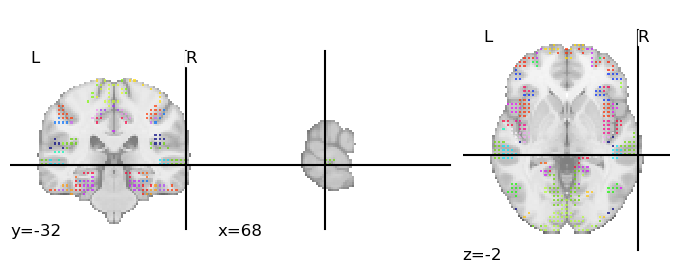

In [208]:
plot_roi(PLA2_GLA_PC1_avg_fit_vis.slicer[:, :, :, 0]) 

In [212]:
COC_PC1_GLA_scores_df["Condition"] = "COC1"
PLA_PC1_GLA_scores_df["Condition"] = "PLA1"
COC2_PC1_GLA_scores_df["Condition"] = "COC2"
PLA2_PC1_GLA_scores_df["Condition"] = "PLA2"

all_conditions_df = [COC_PC1_GLA_scores_df, PLA_PC1_GLA_scores_df, COC2_PC1_GLA_scores_df, PLA2_PC1_GLA_scores_df]

PC1_GLA_ALL_scores_df = pd.concat(all_conditions_df)

print("PC1_GLA_ALL_scores_df shape: " + str(PC1_GLA_ALL_scores_df.shape))

PC1_GLA_ALL_scores_df.head()

PC1_GLA_ALL_scores_df shape: (80, 181)


,Primary_visual_cortex,Medial_superior_temporal_area,Sixth_Visual_Area,Second_Visual_Area,Third_Visual_Area,Forth_Visual_Area,Eighth_Visual_Area,Primary_Motor_Cortex,Primary_Sensory_Cortex,Frontal_Eye_Field,...,Area_TG_ventral,Medial_Belt_Complex,Lateral_Belt_Complex,Auditory_4_Complex,Area_STSv_Anterior,Area_TE1_Middle,Para-Insular_Area,Area_Anterior_32_Prime,Area_Posterior_24.1,Condition
P5203,0.236752,0.0,0.0,0.160212,0.314142,0.296756,0.0,0.345462,0.270620,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.176333,COC1
P5205,0.322811,0.0,0.0,0.306635,0.297220,0.334039,0.0,0.398869,0.413888,1.0,...,0.568928,0.885414,0.0,0.0,0.0,0.0,0.870168,0.0,0.225641,COC1
P5211,0.279523,0.0,0.0,0.254285,0.328261,0.459942,0.0,0.275336,0.270964,0.0,...,1.000000,0.000000,0.0,0.0,0.0,0.0,1.000000,0.0,0.215234,COC1
P5229,0.211192,0.0,0.0,0.300267,0.252131,0.266104,0.0,0.230697,0.328774,0.0,...,0.000000,1.000000,0.0,0.0,0.0,0.0,0.806218,0.0,0.159603,COC1
P5216,0.388438,0.0,0.0,0.287746,0.306579,0.464723,0.0,0.493196,0.301607,1.0,...,0.691538,1.000000,0.0,0.0,0.0,0.0,0.771701,0.0,0.189941,COC1


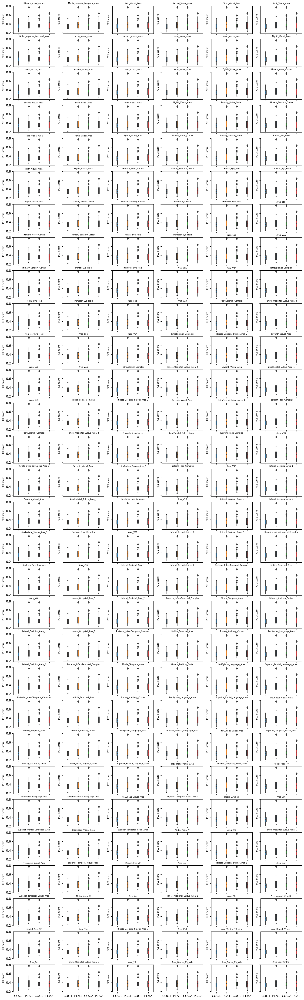

In [242]:
fig, axs = plt.subplots(30, 6, figsize=(16, 55), sharex=True, sharey=True)

for x in range(30):
    for y in range(6):

        current_roi = PLA2_PC1_GLA_scores_df.columns[x+y]
        sns.boxplot(y="Primary_visual_cortex", x="Condition", width=0.1, data=PC1_GLA_ALL_scores_df, ax=axs[x, y])
        axs[x, y].set_xlabel("")
        axs[x, y].set_ylabel('PC1 score', size=7) 
        axs[x, y].set_title(current_roi, fontsize=6)
        